<h1>Analisis Prediktif: Prediksi Harga Ponsel Untuk Menghindari Penipuan<h1>


---
Proyek Submission 1 - Machine Learning Terapan Dicoding

Dibuat oleh: [Kurnivan Noer Yusvianto](https://www.dicoding.com/users/kurnivan_ny)



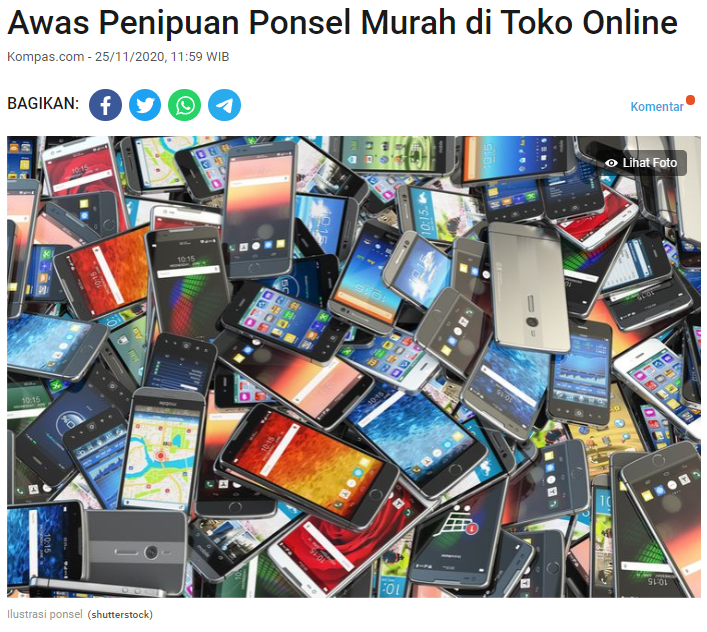

Gambar: [Berita Awas Penipuan Ponsel Murah di Toko Online](https://regional.kompas.com/read/2020/11/25/11595561/awas-penipuan-ponsel-murah-di-toko-online)

# Pendahuluan

Pada proyek Machine Learning Terapan dari Dicoding, topik yang dibahas adalah bisnis yang dibuat untuk memprediksi harga ponsel untuk menghindari penipuan.

#1. Mengimpor pustaka/modul python yang dibutuhkan

In [1]:
# update modul python terbaru
!pip install -U scikit-learn
!pip install -q kaggle

In [2]:
# untuk mengunggah file ke google colab
from google.colab import files

# untuk pengolahan data
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

# untuk visualisasi data
import matplotlib.pyplot as plt
import seaborn as sns

# untuk pembuatan model
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold, GridSearchCV

# untuk evaluasi model
from sklearn.metrics import confusion_matrix, classification_report

#2. Mempersiapkan Dataset

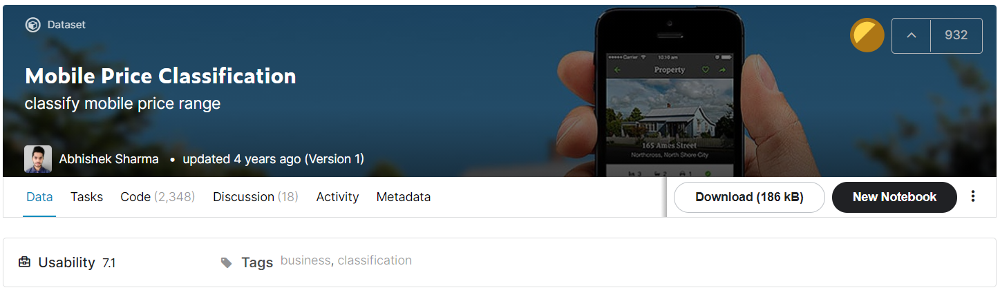

Informasi Data:

| Jenis | Keterangan |
| :--- | :--- |
| Sumber | Kaggle Dataset : [Mobile Price Classification](https://www.kaggle.com/iabhishekofficial/mobile-price-classification?select=train.csv)|
| Kategori | Bisnis dan Klasifikasi |
| Rating Penggunaan | 7.1 (Gold) |
| Jenis dan Ukuran Berkas | CSV (122.4 kB) |

## 2.1 Menyiapkan kredensial akun Kaggle

In [3]:
# unggah file ke google
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"kurnivanny","key":"9eac668f0a33c05d82f77f9b526b5f3c"}'}

In [4]:
# Membuat folder .kaggle di dalam folder root
!rm -rf ~/.kaggle && mkdir ~/.kaggle/

# Menyalin berkas kaggle.json pada direktori aktif saat ini ke folder .kaggle
!mv kaggle.json ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

## 2.1 Mengunggah dan Menyiapkan Dataset

In [5]:
# Mengunduh dataset menggunakan Kaggle CLI
!kaggle datasets download -d iabhishekofficial/mobile-price-classification

  0% 0.00/70.6k [00:00<?, ?B/s]
100% 70.6k/70.6k [00:00<00:00, 62.9MB/s]


In [6]:
# Mengekstrak berkas zip
!unzip /content/mobile-price-classification.zip

Archive:  /content/mobile-price-classification.zip
  inflating: test.csv                
  inflating: train.csv               


# 3. Pemahaman Data *(Data Understanding)*

Pemahaman Data *(Data Understanding)* berupa memahami lebih jauh tentang data yang dikumpulkan sebelumnya dan memeriksa jenis masing-masing data dan mempelajari lebih lanjut tentang atribut(feature) dan namanya.


## 3.1  *Data Loading*

Proses loading data menggunakan library pandas untuk membaca file datanya (file csv).

In [7]:
# Memuat data pada sebuah DataFrame menggunakan pandas
price_df = pd.read_csv("/content/train.csv")
price_df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,2,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,6,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,6,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,14,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,5,336,670,869,18,10,19,1,1,1,0


Terdapat 2.000 baris (records atau jumlah pengamatan) dan 21 kolom dalam dataset.

## 3.2 *Explanatory Data Analysis*

*Explanatory Data Analysis* (EDA) merupakan proses investigasi awal pada data untuk menganalisis karakteristik, menemukan pola, anomali, dan memeriksa asumsi pada data. Teknik ini biasanya menggunakan bantuan statistik dan representasi grafis atau visualisasi. 

[Dicoding - Exploratory Data Analysis - Deskripsi Variabel](https://www.dicoding.com/academies/319/tutorials/17008?from=17006)

### 3.2.1 Deskripsi Variabel

Berdasarkan informasi dari [Kaggle](https://www.kaggle.com/iabhishekofficial/mobile-price-classification?select=train.csv), variabel pada Mobile Price Classification sebagai berikut.

| Variabel | Deskripsi |
| :--- | :--- |
| battery_power | Energi total yang dapat disimpan baterai dalam satu waktu diukur dalam mAh |
| blue | Bluetooth atau tidak |
| clock_speed | Kecepatan di mana mikroprosesor mengeksekusi instruksi |
| dual_sim | Dual SIM atau tidak |
| fc | Resolusi kamera depan (mega piksels) |
| four_g | 4G atau tidak |
| int_memory | Memori internal (Gigabytes) |
| m_dep | Ketebalan ponsel (cm) |
| mobile_wt | Berat ponsel |
| n_cores | Jumlah core dalam processor |
| pc | Resolusi kamera utama (mega pixels) |
| px_height | Tinggi resolusi piksel |
| px_width | Lebar resolusi piksel |
| ram | Random Access Memory (mega byte) |
| sc_h | Tinggi layar ponsel (cm) |
| sc_w | Lebar layar ponsel (cm) |
| talk_time | Waktu terlama satu kali pengisian baterai akan bertahan saat Anda berada |
| three_g | 3G atau tidak |
| touch_screen | Layar sentuh atau tidak |
| wifi | Wifi atau tidak |
| price_range | Variabel target dengan nilai 0 (low cost), 1 (medium cost), 2 (high cost) dan 3 (very high cost) |

Mengubah data numerik menjadi data kategori agar mudah di analisis dan visualisasi


In [8]:
# Variabel Independen
price_df.blue.replace(0,'No', inplace=True)
price_df.blue.replace(1,'Yes', inplace=True)
price_df.dual_sim.replace(0,'No', inplace=True)
price_df.dual_sim.replace(1,'Yes', inplace=True)
price_df.four_g.replace(0,'No', inplace=True)
price_df.four_g.replace(1,'Yes', inplace=True)
price_df.three_g.replace(0,'No', inplace=True)
price_df.three_g.replace(1,'Yes', inplace=True)
price_df.touch_screen.replace(0,'No', inplace=True)
price_df.touch_screen.replace(1,'Yes', inplace=True)
price_df.wifi.replace(0,'No', inplace=True)
price_df.wifi.replace(1,'Yes', inplace=True)

# Variabel Dependent (Variabel Target)
price_df.price_range.replace(0,'low cost', inplace=True)
price_df.price_range.replace(1,'medium cost', inplace=True)
price_df.price_range.replace(2,'high cost', inplace=True)
price_df.price_range.replace(3,'very high cost', inplace=True)

Untuk memahami deskripsi variabel pada data, dapat mengecek pada dataset dengan fungsi berikut.

In [9]:
# Fungsi yang memuat informasi pada DataFrame

def report(df):
  col = []
  d_type = []
  uniques = []
  n_uniques = []

  for i in df.columns:
    col.append(i) # Nama Column
    d_type.append(df[i].dtypes) # Tipe Data
    uniques.append(df[i].unique()[:5]) # Elemen pada variabel
    n_uniques.append(df[i].nunique()) # Jumlah elemen pada variabel

  return pd.DataFrame({'Column': col, 'd_type':d_type, 'unique_sample':uniques, 'n_unique_sample':n_uniques})

In [10]:
report(price_df)

,Column,d_type,unique_sample,n_unique_sample
0,battery_power,int64,"[842, 1021, 563, 615, 1821]",1094
1,blue,object,"[No, Yes]",2
2,clock_speed,float64,"[2.2, 0.5, 2.5, 1.2, 1.7]",26
3,dual_sim,object,"[No, Yes]",2
4,fc,int64,"[1, 0, 2, 13, 3]",20
5,four_g,object,"[No, Yes]",2
6,int_memory,int64,"[7, 53, 41, 10, 44]",63
7,m_dep,float64,"[0.6, 0.7, 0.9, 0.8, 0.1]",10
8,mobile_wt,int64,"[188, 136, 145, 131, 141]",121
9,n_cores,int64,"[2, 3, 5, 6, 1]",8


Untuk mengecek jumlah data kosong (*missing value*) yang biasanya berisi NaN dapat menggunakan isna() atau isnull()

In [11]:
# Menghitung jumlah data kosong (NaN) pada setiap kolom
price_df.isna().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

Untuk duplikasi data dapat menggunakan duplicated()

In [12]:
price_df.duplicated().sum()

0

### 3.2.2 *Univariate Analysis*

*Univariate Analysis* adalah metode yang digunakan untuk menganalisis dan mengeskplorasi data yang berisikan satu variabel dari suatu kumpulan data.

Sebelum melakukan *Univariate Analysis*, perlu membagi fitur pada dataset menjadi dua bagian, yaitu numerical features dan categorical features.


In [13]:
categorical_features = price_df.loc[:, price_df.dtypes == 'object'].columns.to_list()
numerical_features = price_df.loc[:, price_df.dtypes != 'object'].columns.to_list()

Categorical Features

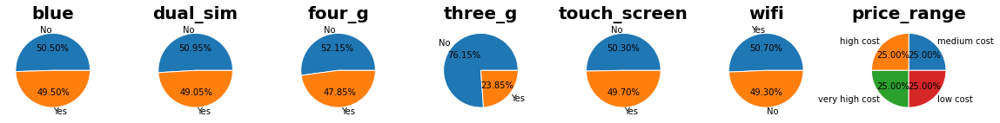

In [14]:
# Analisa terhadap fitur kategori

fig, axs = plt.subplots(ncols=len(categorical_features), figsize= (16,12))
i=0
for feature in categorical_features:
  axs[i].pie(price_df[feature].value_counts(), labels=price_df[feature].unique(), autopct='%.2f%%', wedgeprops=dict(edgecolor='white'))
  axs[i].set_title(feature, fontsize=20, ha='center', fontweight='bold')
  i+=1
  plt.tight_layout()
plt.show()

Variabel Independent:
1. blue, dual_sim, four_g, touch_screen, dan wifi memiliki persentase yang hampir seimbang diantara yes dan no.
2. Sebagian besar ponsel tanpa three_g.

Variabel Dependent (Variabel Target) berupa price_range memiliki data yang seimbang.

Numerical Featurs

In [15]:
# Memuat informasi statistik pada fitur numerik
price_df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0
pc,2000.0,9.91650,6.064315,0.0,5.00,10.0,15.00,20.0
px_height,2000.0,645.10800,443.780811,0.0,282.75,564.0,947.25,1960.0
px_width,2000.0,1251.51550,432.199447,500.0,874.75,1247.0,1633.00,1998.0


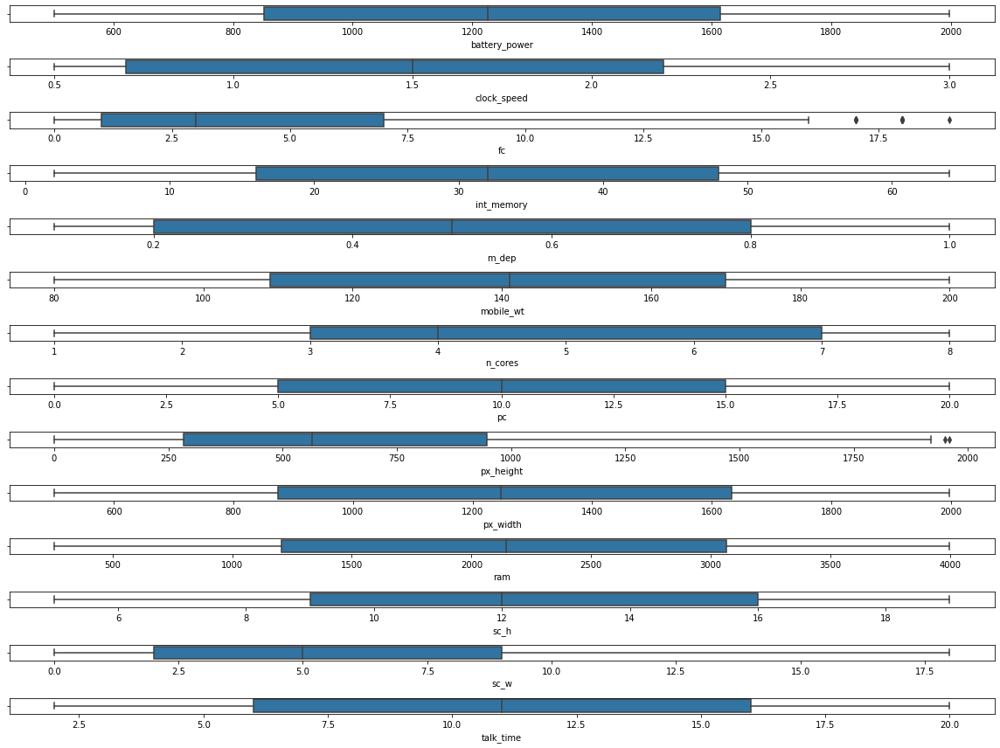

In [16]:
# Mengetahui Outlier pada Fitur Numerik

fig, axs = plt.subplots(len(numerical_features), figsize= (16,12))
i=0
for feature in numerical_features:
  sns.boxplot(price_df[feature], ax=axs[i])
  i+=1
  plt.tight_layout()
plt.show()

Dari tabel diatas, outlier (pencilan data) hanya terdapat pada fc dan masih dalam normal.

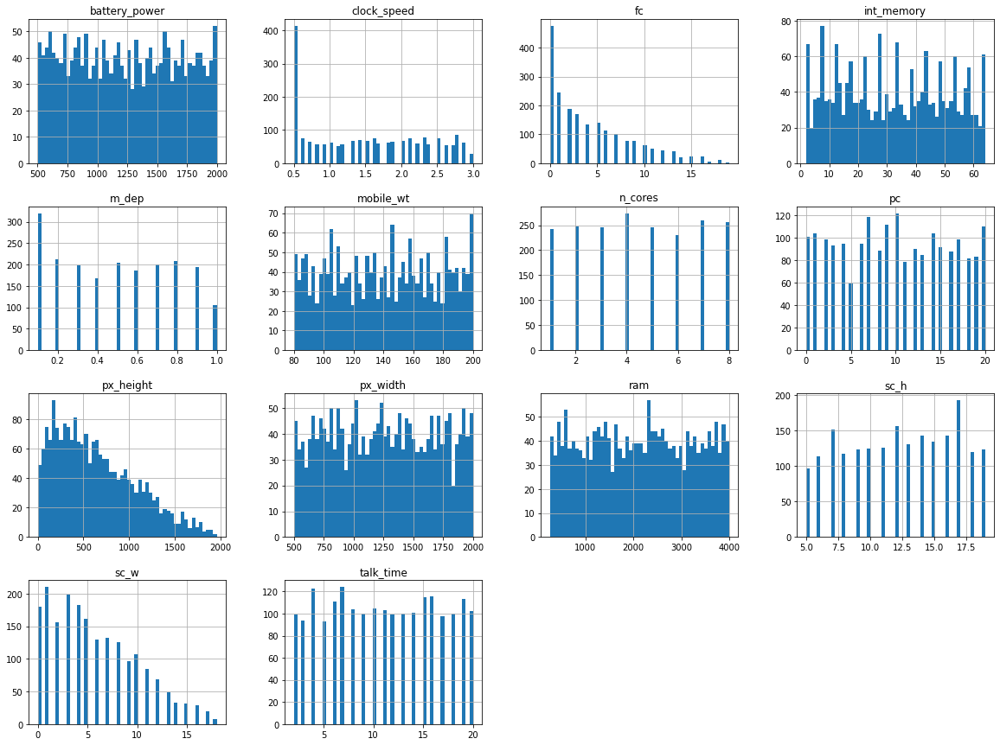

In [17]:
# Analisa terhadap fitur numerik

price_df.hist(bins=50, figsize=(20,15))
plt.show()

### 3.2.3 *Multivariate Analysis*

Untuk mengamati hubungan antara fitur numerik dapat menggunakan fungsi pairplot(). Agar dapat memisahkan sesuai dengan variabel target dapat menggunakan hue dan untuk melihat perkiraan distribusi probabilitas dapat mneggunakan kde di diag_kind.

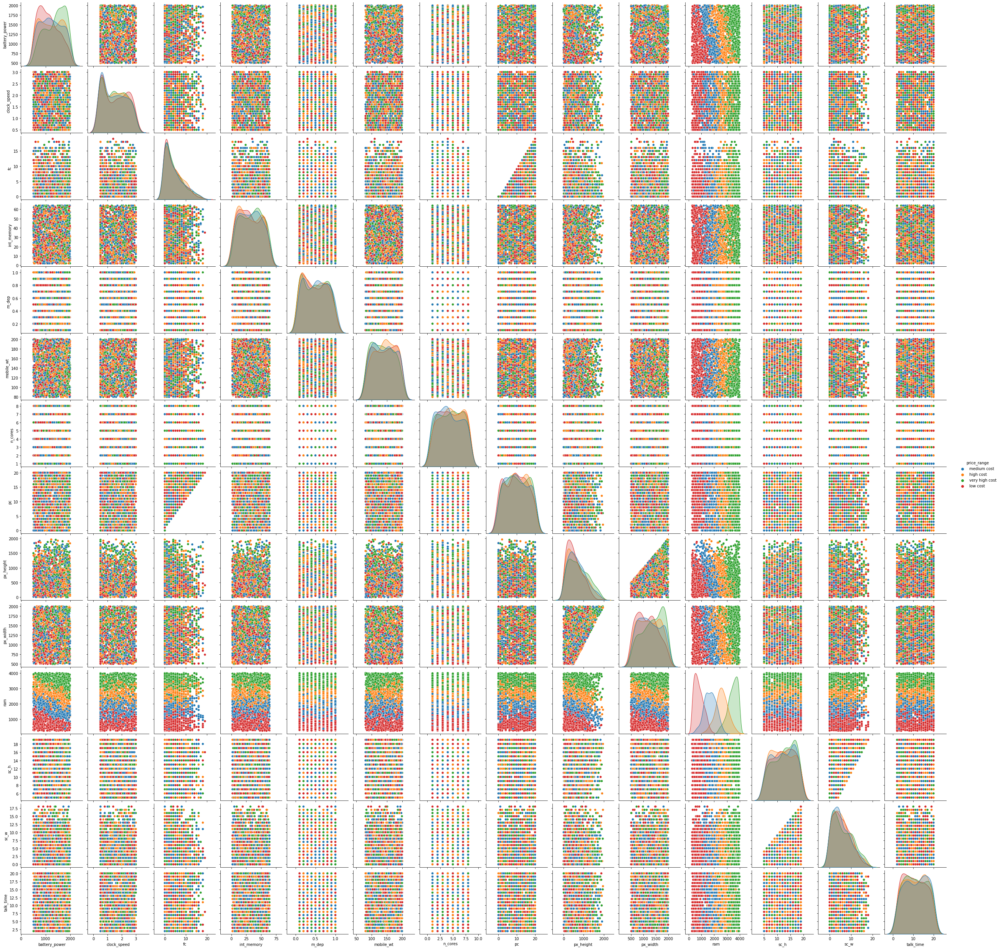

In [18]:
# Visualisasi distribusi data pada kolom dengan fitur numerik dan antar fitur numrerik
sns.pairplot(price_df,  diag_kind = 'kde', hue='price_range')

Untuk mengetahui korelasi antara fitur numerik dapat menggunakan fungsi corr(). Untuk memudahkan dalam menganalisa dapat menggunakan visualisasi heatmap.

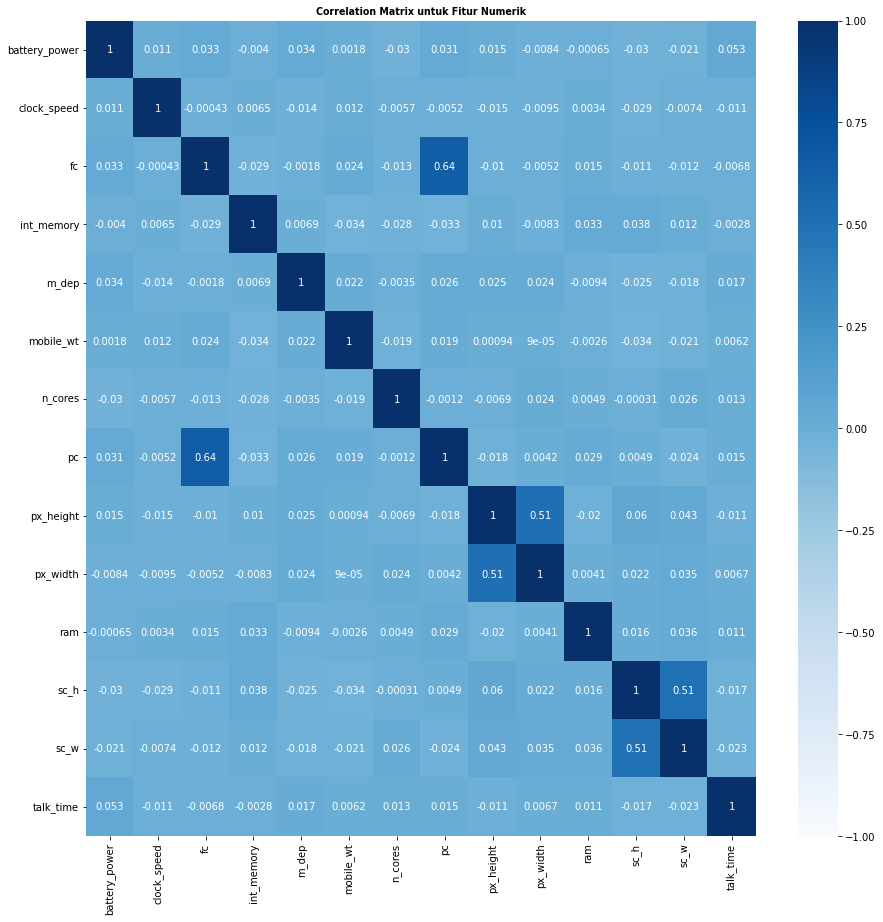

In [19]:
# Visualisasi heatmap dari korelasi antar firut numerik
# Semakin mendekati 1 maka semakin tinggi korelasi antar firut numerik
# Semakin mendekati 0 maka korelasi antar firut numerik mendekati netral
# Semakin mendekati -1 maka semakin rendah korelasi antar firut numerik

plt.figure(figsize=(15,15))
plt.title('Correlation Matrix untuk Fitur Numerik', fontweight='bold', fontsize=9.5)
sns.heatmap(price_df.corr(), annot=True, cmap='Blues', vmin=-1, vmax=1)
plt.show()

#4. Persiapan Data *(Data Preparation)*

Persiapan Data *(Data Preparation)* adalah proses mengubah atau mentransformasi fitur-fitur data ke dalam bentuk yang mudah diinterpretasikan dan diproses oleh model *machine learning*.

## 4.1 Encoding Fitur Kategori *(Categorical Encoding)*

Encoding Fitur Kategori *(Categorical Encoding)* adalah proses mengubah data kategori menjadi data numerik.



One-Hot Encoding untuk data nominal. Data nominal diklasifikasikan tanpa urutan atau peringkat.

In [20]:
# Melakukan encoding fitur kategori (tanpa vatiabel target) dengan One-Hot Encoding

price_df = pd.get_dummies(price_df, columns=price_df.loc[:, (price_df.dtypes == 'object') & (price_df.columns != 'price_range')].columns.to_list())

Label Encoding digunakan untuk data ordinal. Data ordinal memiliki urutan yang telah ditentukan. Urutan ini berdasarkan data yang diperoleh dari [Kaggle](https://www.kaggle.com/iabhishekofficial/mobile-price-classification?select=train.csv).

In [21]:
# Melakukan encoding pada variabel dependent (variabel target) secara manual
price_df.price_range.replace('low cost', 0, inplace=True)
price_df.price_range.replace('medium cost', 1, inplace=True)
price_df.price_range.replace('high cost', 2, inplace=True)
price_df.price_range.replace('very high cost', 3, inplace=True)

In [22]:
price_df

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,price_range,blue_No,blue_Yes,dual_sim_No,dual_sim_Yes,four_g_No,four_g_Yes,three_g_No,three_g_Yes,touch_screen_No,touch_screen_Yes,wifi_No,wifi_Yes
0,842,2.2,1,7,0.6,188,2,2,20,756,2549,9,7,19,1,1,0,1,0,1,0,1,0,1,0,0,1
1,1021,0.5,0,53,0.7,136,3,6,905,1988,2631,17,3,7,2,0,1,0,1,0,1,0,1,0,1,1,0
2,563,0.5,2,41,0.9,145,5,6,1263,1716,2603,11,2,9,2,0,1,0,1,0,1,0,1,0,1,1,0
3,615,2.5,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,2,0,1,1,0,1,0,0,1,1,0,1,0
4,1821,1.2,13,44,0.6,141,2,14,1208,1212,1411,8,2,15,1,0,1,1,0,0,1,0,1,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,0.5,0,2,0.8,106,6,14,1222,1890,668,13,4,19,0,0,1,0,1,0,1,0,1,0,1,1,0
1996,1965,2.6,0,39,0.2,187,4,3,915,1965,2032,11,10,16,2,0,1,0,1,1,0,0,1,0,1,0,1
1997,1911,0.9,1,36,0.7,108,8,3,868,1632,3057,9,1,5,3,1,0,0,1,0,1,0,1,0,1,1,0
1998,1512,0.9,4,46,0.1,145,5,5,336,670,869,18,10,19,0,1,0,1,0,0,1,0,1,0,1,0,1


## 4.2 *Data Splitting* dengan train_test_split

Sebelum dataset dilatih di model *machine learning*, kita perlu untuk membagi dataset menjadi 2, yaitu data latih *(train data)* dan data test *(test data)*. Rasio pembagian data latih *(train data)* dan data test *(test data)* adalah 80:20.

In [23]:
# Memisahkan antara variabel independen dan variabel target

X = price_df.drop('price_range', axis=1).values
y = price_df['price_range'].values

In [24]:
# Memisahkan data latih (train data) dan data test (test data)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42, stratify=y)

In [25]:
print(f'Total Semua Data              : {len(X)}')
print(f'Total Data Latih (Train Data) : {len(X_train)}')
print(f'Total Data Test (Test Data)   : {len(X_test)}')

Total Semua Data              : 2000
Total Data Latih (Train Data) : 1600
Total Data Test (Test Data)   : 400


## 4.3 Standarisasi nilai pada fitur numerik dengan StandardScaler

Fungsi dari standarisasi nilai pada fitur numerik adalah untuk membuat numerical data pada varibel independen memiliki rentang nilai (scale) yang sama.

StandarScaler mengubah distribusi data menjadi Distribusi Gaussian atau Distribusi Normal.

In [26]:
# Sampel sebelum standardisasi
print(X_train[0:3])
print("")
print(X_test[0:3])

[[1.845e+03 5.000e-01 1.000e+01 6.100e+01 3.000e-01 9.600e+01 1.000e+00
  1.200e+01 2.920e+02 6.950e+02 1.731e+03 9.000e+00 5.000e+00 6.000e+00
  0.000e+00 1.000e+00 0.000e+00 1.000e+00 1.000e+00 0.000e+00 1.000e+00
  0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00]
 [1.271e+03 5.000e-01 1.200e+01 3.200e+01 1.000e-01 1.130e+02 7.000e+00
  1.500e+01 1.350e+03 1.949e+03 4.450e+02 1.500e+01 1.400e+01 1.400e+01
  0.000e+00 1.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00
  0.000e+00 1.000e+00 0.000e+00 0.000e+00 1.000e+00]
 [7.880e+02 2.500e+00 4.000e+00 5.700e+01 9.000e-01 9.100e+01 8.000e+00
  1.200e+01 4.200e+01 1.161e+03 3.969e+03 1.200e+01 8.000e+00 6.000e+00
  1.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00 0.000e+00
  1.000e+00 0.000e+00 1.000e+00 0.000e+00 1.000e+00]]

[[1.773e+03 2.500e+00 1.600e+01 3.200e+01 6.000e-01 1.700e+02 6.000e+00
  1.800e+01 1.215e+03 1.472e+03 3.566e+03 1.700e+01 6.000e+00 1.300e+01
  0.000e+00 1.000e+00 1.000e+00 0.000e+00 0.000

In [27]:
# Inisialisasi fungsi StandardScaler
scaler = StandardScaler()

In [28]:
# StandardScaler data latih (train data)
X_train = scaler.fit_transform(X_train)

# StandardScaler data test (test data)
X_test = scaler.fit_transform(X_test)

In [29]:
# Sampel setelah standardisasi
print(X_train[0:3])
print("")
print(X_test[0:3])

[[ 1.38919326 -1.25918898  1.30925256  1.58482903 -0.70458975 -1.25033529
  -1.5516371   0.35023908 -0.79884868 -1.28564151 -0.36302366 -0.78128983
  -0.17762722 -0.89664506 -1.011314    1.011314   -0.98634324  0.98634324
   1.03693152 -1.03693152  1.78870765 -1.78870765  1.00878862 -1.00878862
   1.02532046 -1.02532046]
 [ 0.07840603 -1.25918898  1.77045998 -0.00345726 -1.39684863 -0.76837395
   1.0731587   0.84454887  1.58230174  1.63767503 -1.54789561  0.64708236
   1.87520744  0.56094407 -1.011314    1.011314    1.01384584 -1.01384584
   1.03693152 -1.03693152  1.78870765 -1.78870765  1.00878862 -1.00878862
  -0.97530483  0.97530483]
 [-1.02457347  1.18747125 -0.0743697   1.36575506  1.37218691 -1.39208862
   1.51062466  0.35023908 -1.36150237 -0.19930538  1.69898521 -0.06710374
   0.506651   -0.89664506  0.98881258 -0.98881258 -0.98634324  0.98634324
  -0.96438384  0.96438384 -0.55906285  0.55906285 -0.99128795  0.99128795
  -0.97530483  0.97530483]]

[[ 1.18495663e+00  1.24414464

# 5. Pembuatan Model *(Modeling)*

Pada tahap ini, kita menggunakan model *machine learning* berupa *Support Vector Machine (SVM)* dan *Hyper Parameter Tuning* dari model *Support Vector Machine (SVM)* untuk menemukan parameter terbaik.

## 5.1 Model Baseline dengan *Support Vector Machine (SVM)*

In [30]:
# Pembuatan model baseline
base_model = SVC()

# Melakukan training
base_model.fit(X_train, y_train)

SVC()

In [31]:
# Pengujian model terhadap data test
y_pred = base_model.predict(X_test)

In [32]:
# classification report model baseline
cr_base = classification_report(y_test, y_pred, output_dict=True, target_names=['low cost', 'medium cost', 'high cost', 'very high cost'])
pd.DataFrame(cr_base).T

,precision,recall,f1-score,support
low cost,0.920792,0.9300,0.925373,100.0000
medium cost,0.833333,0.8000,0.816327,100.0000
high cost,0.777778,0.8400,0.807692,100.0000
very high cost,0.926316,0.8800,0.902564,100.0000
accuracy,0.862500,0.8625,0.862500,0.8625
macro avg,0.864555,0.8625,0.862989,400.0000
weighted avg,0.864555,0.8625,0.862989,400.0000


In [33]:
# confusion matrix model baseline
cf_base = confusion_matrix(y_test, y_pred)

## 5.2 Pengembangan Model *Support Vector Machine (SVM)* dengan *Hyper Parameter Tuning* menggunakan GridSearchCV

Referensi parameter Model *Support Vector Machine (SVM)* yang digunakan berdasarkan [*scikit-learn*](https://scikit-learn.org/stable/modules/svm.html) dan [geeksforgeeks](https://www.geeksforgeeks.org/svm-hyperparameter-tuning-using-gridsearchcv-ml/).

In [34]:
# Menetapakn hyperparameter yang akan di tuning
parameters = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf'] 
}

In [35]:
# Menetapkan StratifiedKFold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Pembuatan model untuk GridSearchCV
grid = GridSearchCV(base_model, parameters, cv=skf, verbose=1, scoring='accuracy', n_jobs=-1)

# Melakukan Training
grid.fit(X_train,y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             scoring='accuracy', verbose=1)

In [36]:
print("Best parameter: ", grid.best_estimator_)
print("Score: ", grid.best_score_)

Best parameter:  SVC(C=1000, gamma=0.001)
Score:  0.9375


In [37]:
# Pembuatan model best parameter
best_model = grid.best_estimator_

# Melakukan training
best_model.fit(X_train, y_train)

SVC(C=1000, gamma=0.001)

In [38]:
# Pengujian model terhadap data test
y_pred = best_model.predict(X_test)

In [39]:
# classification report model best parameter
cr_best = classification_report(y_test, y_pred, output_dict=True, target_names=['low cost', 'medium cost', 'high cost', 'very high cost'])
pd.DataFrame(cr_best).T

,precision,recall,f1-score,support
low cost,0.970000,0.9700,0.970000,100.0000
medium cost,0.931373,0.9500,0.940594,100.0000
high cost,0.948454,0.9200,0.934010,100.0000
very high cost,0.960396,0.9700,0.965174,100.0000
accuracy,0.952500,0.9525,0.952500,0.9525
macro avg,0.952556,0.9525,0.952445,400.0000
weighted avg,0.952556,0.9525,0.952445,400.0000


In [40]:
# confusion matrix model best parameter
cf_best = confusion_matrix(y_test, y_pred)

#6. Evaluasi Model *(Model Evaluation)*

Mengevaluasi model klasifikasi kita menggukan metrik pada classification report dan confusion matriks.

## 6.1 Perbandingan metriks antara model baseline dengan model yang dikembangkan

In [41]:
print("Classification Report Model Baseline")
pd.DataFrame(cr_base).T

Classification Report Model Baseline


,precision,recall,f1-score,support
low cost,0.920792,0.9300,0.925373,100.0000
medium cost,0.833333,0.8000,0.816327,100.0000
high cost,0.777778,0.8400,0.807692,100.0000
very high cost,0.926316,0.8800,0.902564,100.0000
accuracy,0.862500,0.8625,0.862500,0.8625
macro avg,0.864555,0.8625,0.862989,400.0000
weighted avg,0.864555,0.8625,0.862989,400.0000


In [42]:
print("Classification Report Model Best Parameter")
pd.DataFrame(cr_best).T

Classification Report Model Best Parameter


,precision,recall,f1-score,support
low cost,0.970000,0.9700,0.970000,100.0000
medium cost,0.931373,0.9500,0.940594,100.0000
high cost,0.948454,0.9200,0.934010,100.0000
very high cost,0.960396,0.9700,0.965174,100.0000
accuracy,0.952500,0.9525,0.952500,0.9525
macro avg,0.952556,0.9525,0.952445,400.0000
weighted avg,0.952556,0.9525,0.952445,400.0000


## 6.2 Perbandingan confusion matriks antara model baseline dengan model yang dikembangkan

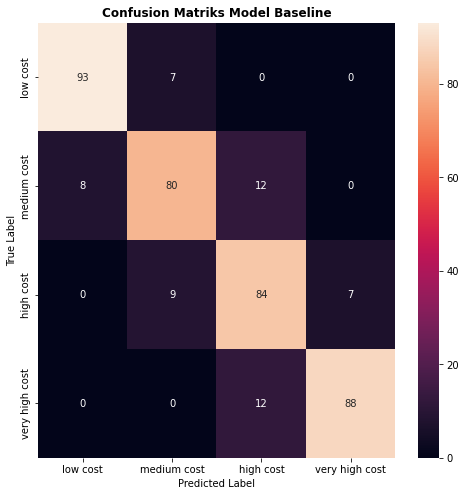

In [43]:
# Visualisasi hasil prediksi model baseline
fig, ax = plt.subplots(figsize=(8,8))
ax = sns.heatmap(cf_base, annot=True, fmt='g')

ax.set_yticklabels(['low cost', 'medium cost', 'high cost', 'very high cost'])
ax.set_xticklabels(['low cost', 'medium cost', 'high cost', 'very high cost'])

ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')

ax.set_title('Confusion Matriks Model Baseline', fontweight='bold')
plt.show()

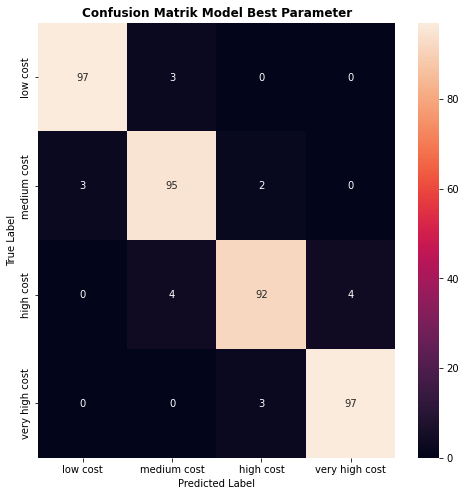

In [44]:
# Visualisasi hasil prediksi model best parameter
fig, ax = plt.subplots(figsize=(8,8))
ax = sns.heatmap(cf_best, annot=True, fmt='g')

ax.set_yticklabels(['low cost', 'medium cost', 'high cost', 'very high cost'])
ax.set_xticklabels(['low cost', 'medium cost', 'high cost', 'very high cost'])

ax.set_xlabel('Predicted Label')
ax.set_ylabel('True Label')

ax.set_title('Confusion Matrik Model Best Parameter', fontweight='bold')
plt.show()

# Penutup

Model yang digunakan untuk memprediksi harga ponsel agar terhindar dari penipuan telah selesai dibuat. Tingkat akurasi sudah tinggi karena menggunakan SVM. Untuk pengembangan lain dapat dilakukan dengan memilih model yang tidak rumit tetapi memiliki akurasi tinggi.

**Referensi**
*   Dokumentasi Scikit-Learn: https://scikit-learn.org/stable/modules/classes.html
*   Dataset: https://www.kaggle.com/iabhishekofficial/mobile-price-classification